<a href="https://colab.research.google.com/github/rashmi05pathak/CS6910_Assignment_2/blob/main/YOLO1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np

In [2]:
import os
from google.colab import drive

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
net = cv2.dnn.readNet('/content/drive/MyDrive/CS6910_Assignment2/yolov3.weights','/content/drive/MyDrive/CS6910_Assignment2/yolov3.cfg')
classes = []
with open('/content/drive/MyDrive/CS6910_Assignment2/coco.names','r') as f:
    classes = f.read().splitlines()

In [ ]:
#classes

In [5]:
from google.colab.patches import cv2_imshow

In [13]:
cap = cv2.VideoCapture('/content/drive/MyDrive/CS6910_Assignment2/paris.mp4')
img = cv2.imread('/content/drive/MyDrive/CS6910_Assignment2/dog.jpeg') #reference image for fixing height and width
count = 0
video_name = 'objectdetected1.avi'
while True: #Let's detect only 50 frames
    _, img = cap.read()

    if count == 0: #setting the frame height and width
        frame = img
        height_f, width_f, layers_f = frame.shape
        video = cv2.VideoWriter(video_name, 0, 1, (width_f, height_f))
         
    height,width,_ = img.shape

    blob = cv2.dnn.blobFromImage(img,1/255,(416,416),(0,0,0),swapRB=True, crop=False)
    net.setInput(blob)
    output_layers_names = net.getUnconnectedOutLayersNames()
    layersOutput = net.forward(output_layers_names)

    boxes = []
    confidences = []
    class_ids = []

    for output in layersOutput:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5: #Keeping threshold more than 0.5
                center_x = int(detection[0]*width)
                center_y = int(detection[1]*height)
                w = int(detection[2]*width)
                h = int(detection[3]*height)

                x = int(center_x-w/2)
                y = int(center_y-h/2)

                boxes.append([x,y,w,h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes,confidences,0.5,0.4)

    font  = cv2.FONT_HERSHEY_PLAIN
    colors = np.random.uniform(0,255,size=(len(boxes),3))

    for i in indexes.flatten():
        x,y,w,h = boxes[i]
        label = str(classes[class_ids[i]])
        confidence = str(round(confidences[i],2))
        color = colors[i]
        #generating video from the object detected image which looks like suspicious
        if (label == 'backpack' or label == 'umbrela' or label == 'handbag' or label == 'suitcase'):
            cv2.rectangle(img,(x,y),(x+w,y+h),color,2)
            cv2.putText(img,label+" "+confidence,(x,y+20),font,2,(255,255,255),2)
            video.write(img) 

    #cv2_imshow(img)
    key = cv2.waitKey(1)
    if key == 27:
        break
    count +=1
#cap.realease()
cv2.destroyAllWindows()
# Deallocating memories taken for window creation
#cv2.destroyAllWindows() 
video.release()  # releasing the video generated

AttributeError: ignored

In [14]:
cap = cv2.VideoCapture('objectdetected1.avi')

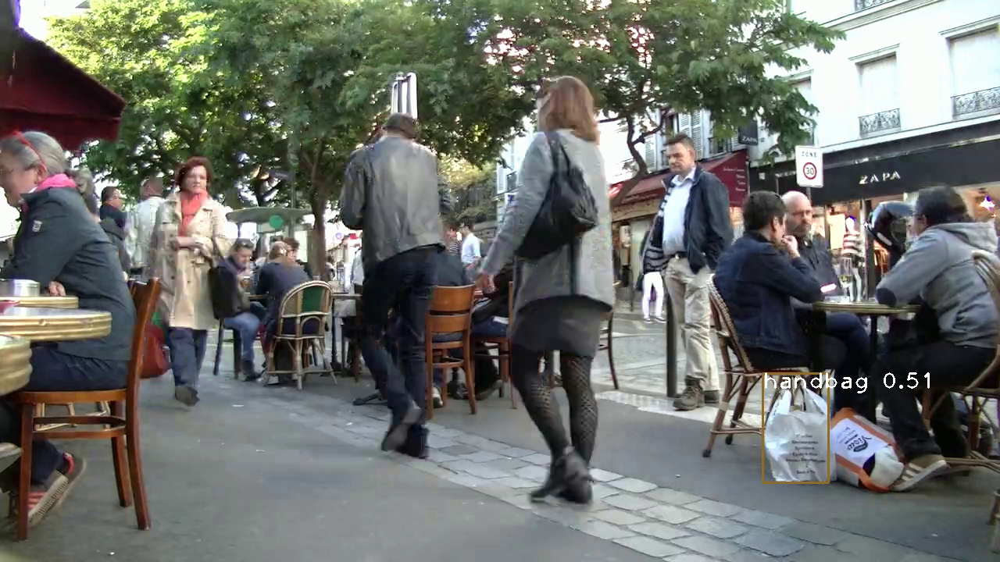

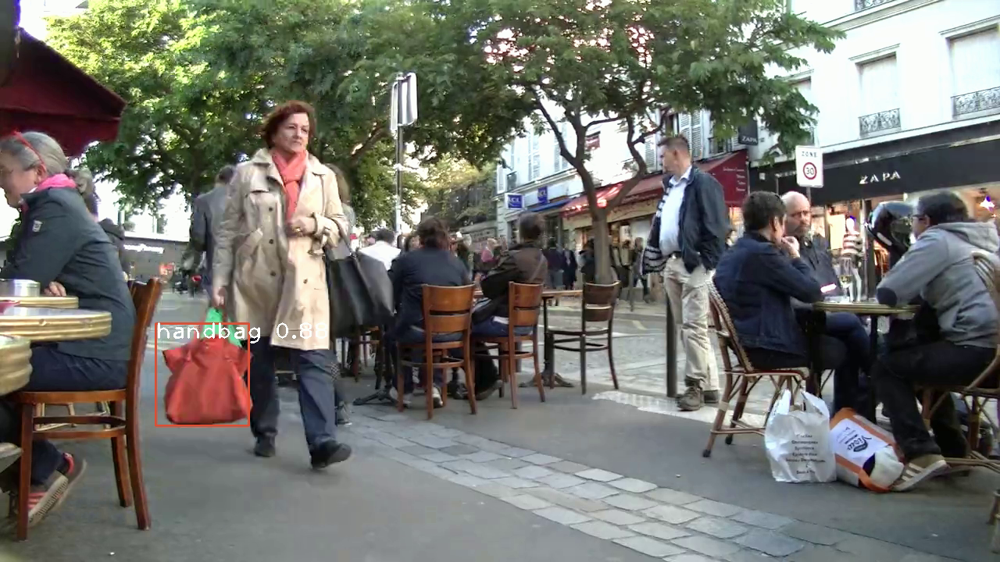

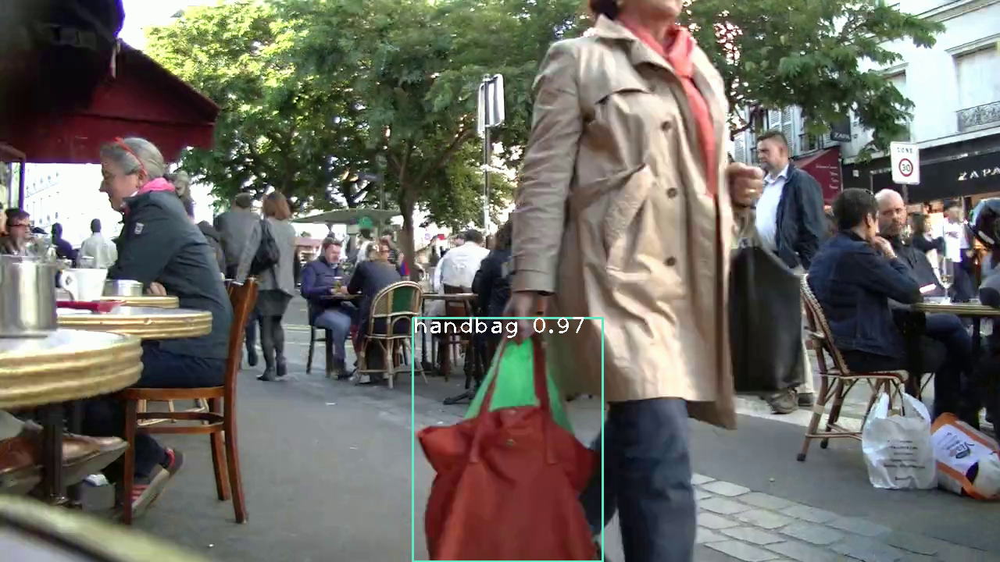

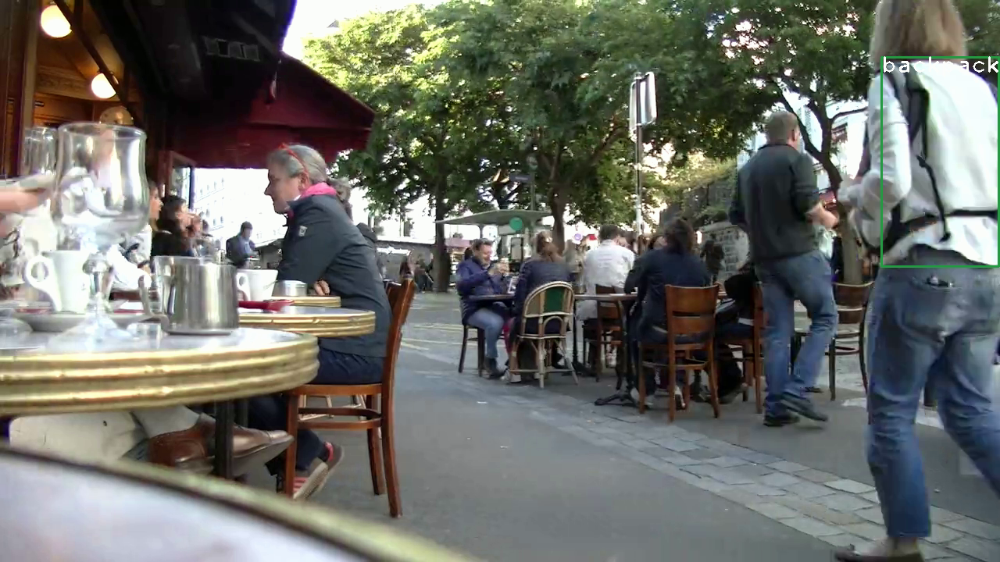

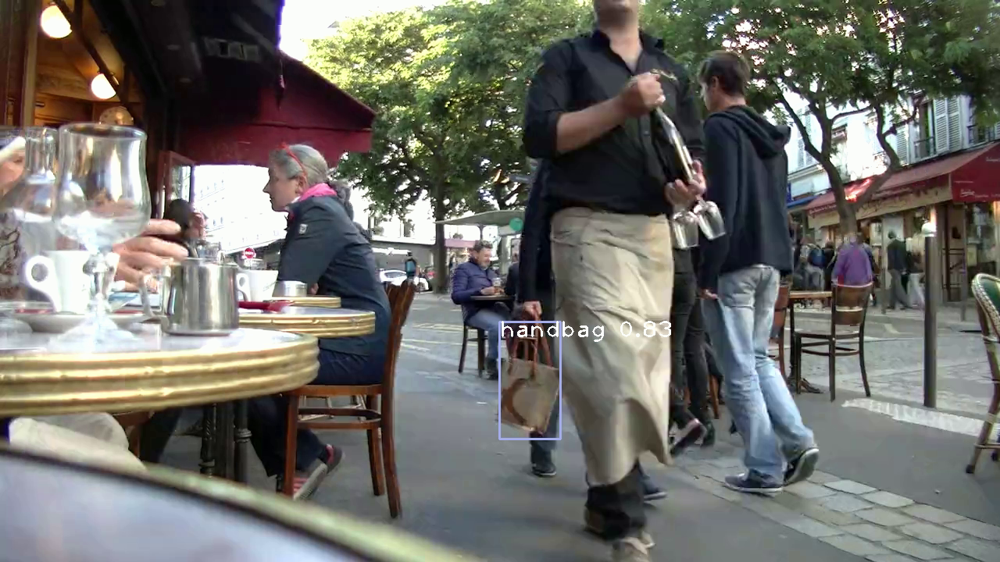

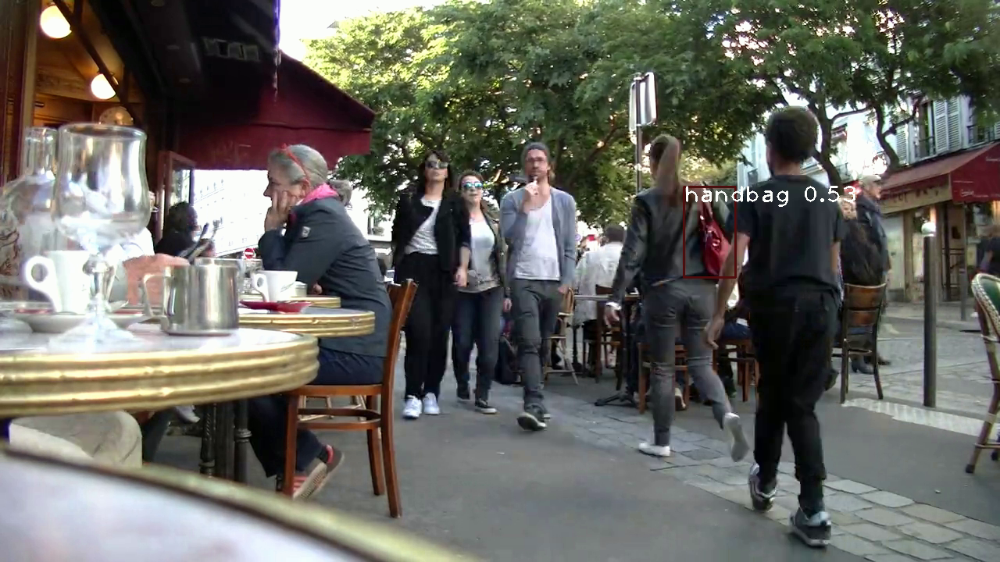

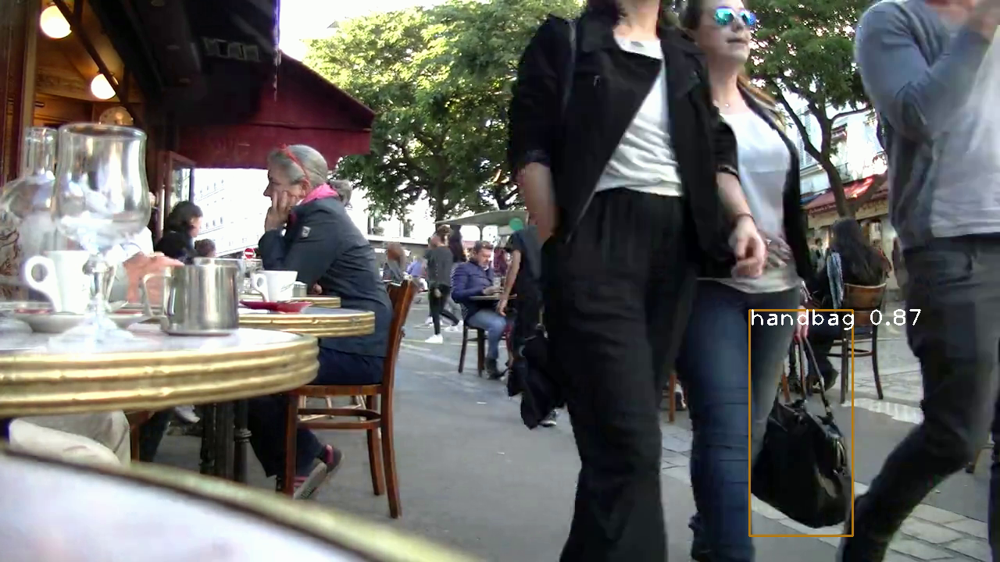

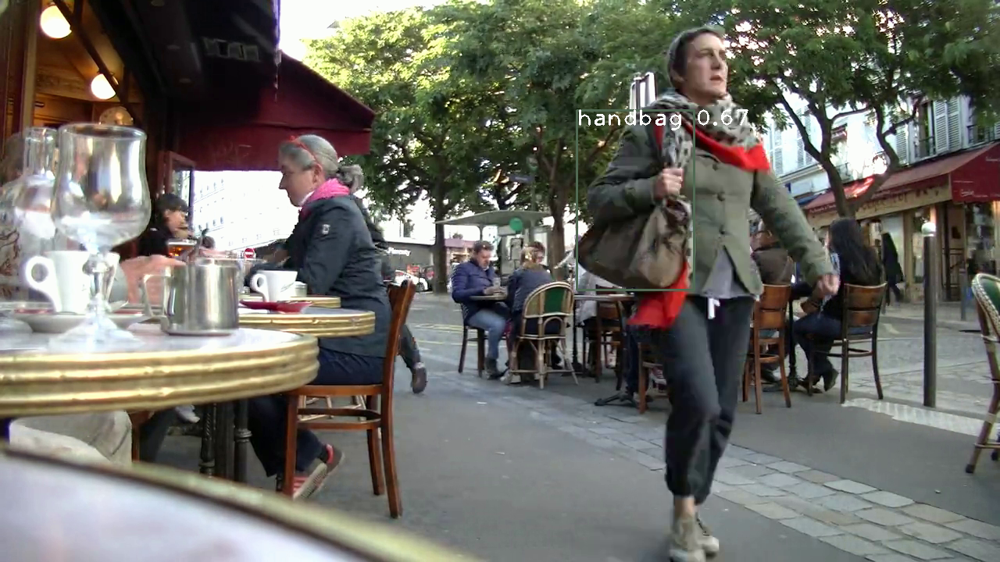

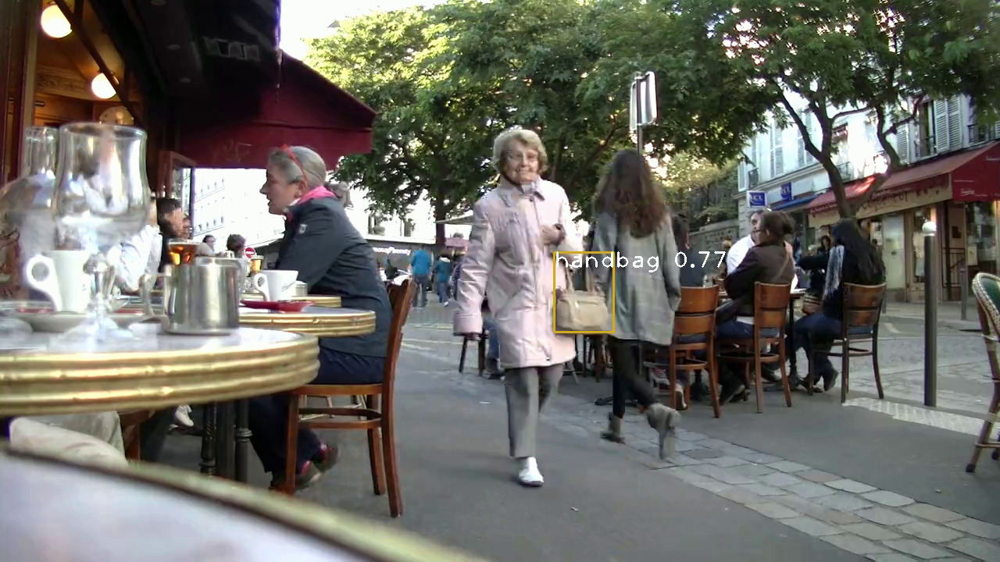

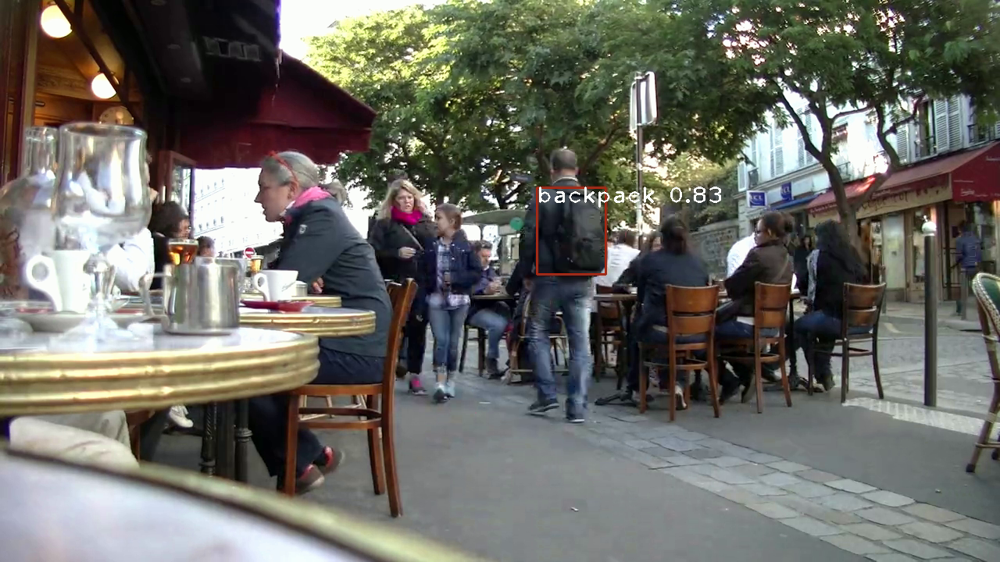

In [15]:
count = 0
while count<10:
  _, img = cap.read()
  cv2_imshow(img)
  count+=1